In [1]:
from pathlib import Path
import numpy as np
import pickle
import pandas as pd


In [2]:
import sys
sys.path.append('/home/<User>/repos/csg_is')

from py_dataset import sys_func
from py_dataset import feature_plotting

In [3]:
file_path = Path('/media/<User>/DC/IS_Data_Exploration_and_Feature_Engineering_for_an_IoT_Device_Behavior_Fingerprinting_Dataset/sys_system_calls_Heqing_device2/merged_data.npz')
assert file_path.exists(), 'Data not found'

In [4]:
with np.load(file_path, allow_pickle=True) as npz:
    print(npz.files)
    X = npz['arr_0']
print(X.shape)

vectorizer = sys_func.create_CountVectorizer()
cols = vectorizer.get_feature_names_out()
cols = np.append(cols, [['timestamp'], ['label']])
print (cols.shape)
df = pd.DataFrame(X, columns=cols)

label_encoder = sys_func.create_label_encoder_for_labels()
df['label'] = label_encoder.inverse_transform(df['label'].values.astype(int))

['arr_0']
(11428, 162)
Loaded set: ('accept', 'accept4', 'access', 'add_key', 'adjtimex', 'bind', 'brk', 'capget', 'capset', 'chdir', 'chmod', 'chown32', 'clock_gettime', 'clone', 'close', 'connect', 'dup', 'dup2', 'dup3', 'epoll_create1', 'epoll_ctl', 'epoll_wait', 'eventfd2', 'execve', 'exit', 'exit_group', 'faccessat', 'fadvise64_64', 'fallocate', 'fchdir', 'fchmod', 'fchmodat', 'fchown32', 'fcntl64', 'fgetxattr', 'flistxattr', 'flock', 'fsetxattr', 'fstat64', 'fstatat64', 'fstatfs64', 'fsync', 'ftruncate64', 'futex', 'getcwd', 'getdents64', 'getegid32', 'geteuid32', 'getgid32', 'getgroups32', 'getpeername', 'getpgid', 'getpgrp', 'getpid', 'getppid', 'getpriority', 'getrandom', 'getresgid32', 'getresuid32', 'getsid', 'getsockname', 'getsockopt', 'gettid', 'gettimeofday', 'getuid32', 'getxattr', 'inotify_add_watch', 'ioctl', 'ioprio_get', 'ioprio_set', 'kcmp', 'keyctl', 'kill', 'lchown32', 'lgetxattr', 'llseek', 'lseek', 'lstat64', 'madvise', 'mkdir', 'mknod', 'mmap2', 'mount', 'mpro

In [5]:
df.head(1)

,accept,accept4,access,add_key,adjtimex,bind,brk,capget,capset,chdir,...,uname,unlink,unlinkat,utimensat,wait4,waitid,write,writev,timestamp,label
0,0.0,0.000017,0.001,0.0,0.0,0.000003,0.001033,0.00005,0.00002,0.000004,...,0.000261,0.000014,0.000008,0.0,0.000495,0.000015,0.029428,0.000004,1.699708e+09,6_beurk


#### Plots

In [6]:
vectors = df.iloc[:, :-2]
vectors_scaled = feature_plotting.minmax_scale_features(vectors,
                                                        remove_outliers_iqr_all_columns=False,
                                                        cols_to_exclude_from_scaling=[])

df_scaled = vectors_scaled.copy()
df_scaled['label'] = df['label']
df_scaled['timestamp'] = df['timestamp']

###### Merged over Labels

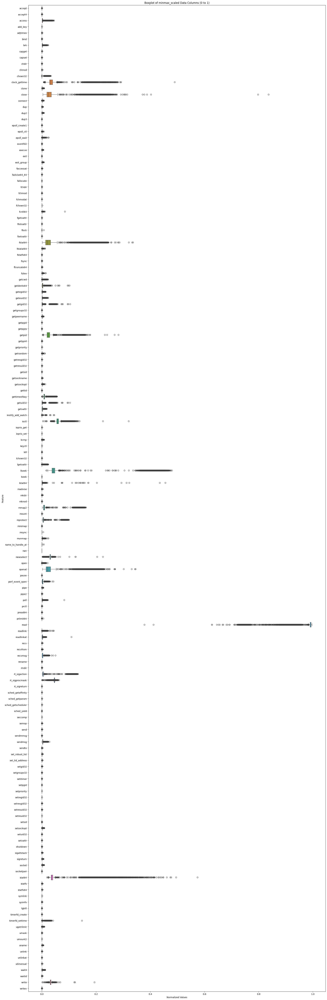

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(24, 80))
sns.boxplot(data=vectors, native_scale=True, orient="h")  # x="class", y="age", legend="full", 

plt.ylabel('Feature')
# plt.xticks(rotation=45)
plt.xlabel('Normalized Values')

plt.title('Boxplot of minmax_scaled Data Columns (0 to 1)')
plt.show()

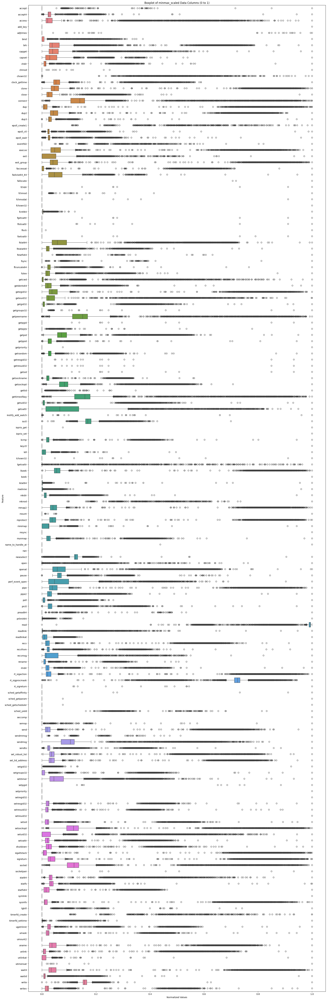

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(24, 80))
sns.boxplot(data=vectors_scaled, native_scale=True, orient="h")  # x="class", y="age", legend="full", 

plt.ylabel('Feature')
# plt.xticks(rotation=45)
plt.xlabel('Normalized Values')

plt.title('Boxplot of minmax_scaled Data Columns (0 to 1)')
plt.show()

##### Split into labels

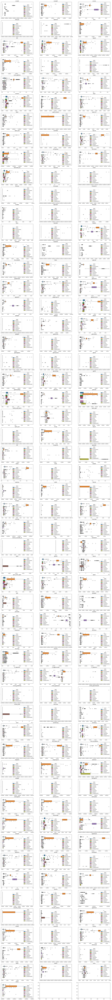

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(54, 3, figsize=(24, 220))

axs = axs.flatten()


for i, column in enumerate(df.columns):
    if column == "label" or column == "timestamp":
        continue

    sns.boxplot(data=df, x=column, ax=axs[i], hue="label", native_scale=True, orient="h",
                legend=True)
    axs[i].set_title(f'{column}')
    axs[i].set_xlabel('')

plt.show()

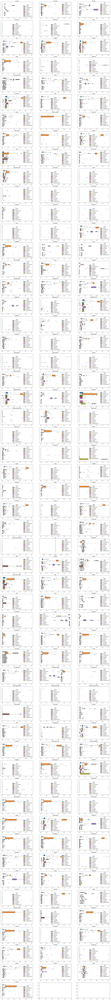

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(54, 3, figsize=(24, 220))

axs = axs.flatten()


for i, column in enumerate(df_scaled.columns):
    if column == "label" or column == "timestamp":
        continue

    sns.boxplot(data=df_scaled, x=column, ax=axs[i], hue="label", native_scale=True, orient="h",
                legend=True)
    axs[i].set_title(f'{column}')
    axs[i].set_xlabel('')

plt.show()

### Testing PCA

In [11]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Initialize a list to store the explained variance ratios
explained_variance_ratios = []

# Perform PCA in several rounds, varying the number of components
for n_components in range(1, 11):
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X[:, :-2])
    explained_variance_ratios.append(pca.explained_variance_ratio_.sum())

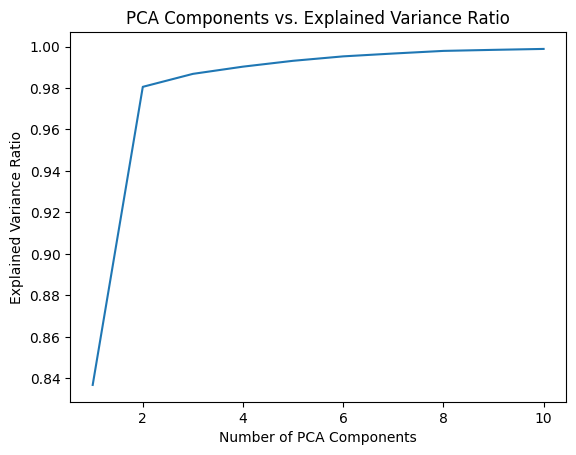

In [12]:
# Plot the explained variance ratios
plt.plot(range(1, 11), explained_variance_ratios)
plt.xlabel('Number of PCA Components')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Components vs. Explained Variance Ratio')
plt.show()

In [13]:
print("The second component already explains ~0.9805749462367638% of the variance, which is an extremely high value and enough for here.")
explained_variance_ratios

The second component already explains ~0.9805749462367638% of the variance, which is an extremely high value and enough for here.


[0.8367923431073182,
 0.9805749462367628,
 0.9868319160776392,
 0.9903160949023201,
 0.993137124638921,
 0.9952757304358456,
 0.996647481118043,
 0.9979124438982031,
 0.9984167686318278,
 0.998865550790888]

In [14]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X[:, :-2])
print(pca.explained_variance_ratio_.sum())
X_pca.shape

0.9805749462367646


(11428, 2)

In [15]:
X_pca = np.column_stack((X_pca, X[:, -2:]))
X_pca.shape

(11428, 4)

In [16]:
df_pca = pd.DataFrame(X_pca, columns=['pca1','pca2', 'timestamp', 'label'])

label_encoder = sys_func.create_label_encoder_for_labels()
df_pca['label'] = label_encoder.inverse_transform(df_pca['label'].values.astype(int))

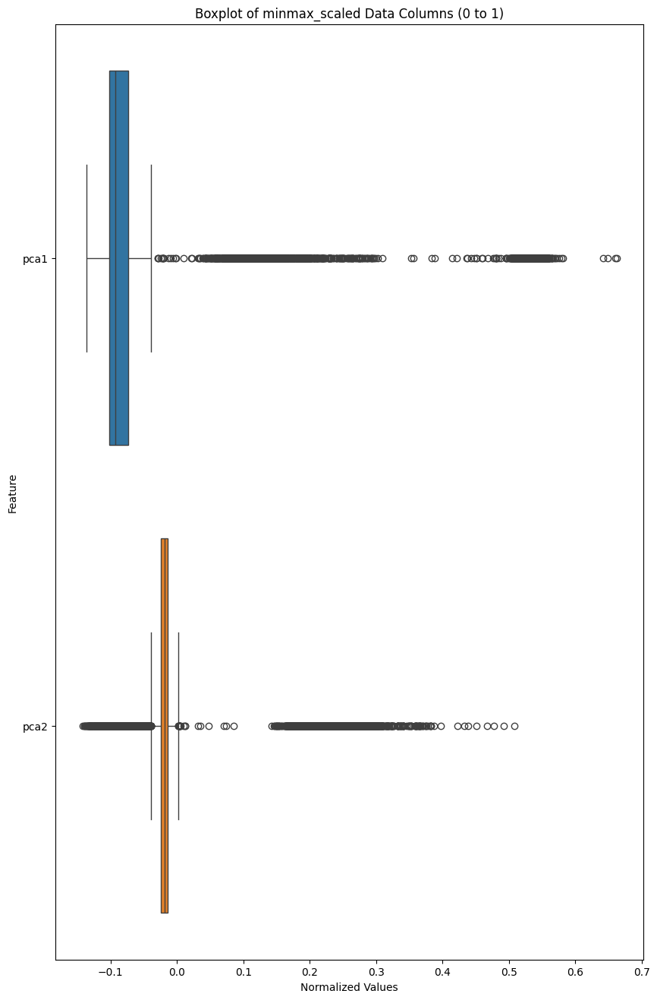

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 16))
sns.boxplot(data=df_pca.iloc[:, :-2], native_scale=True, orient="h")  # x="class", y="age", legend="full", 

plt.ylabel('Feature')
# plt.xticks(rotation=45)
plt.xlabel('Normalized Values')

plt.title('Boxplot of minmax_scaled Data Columns (0 to 1)')
plt.show()

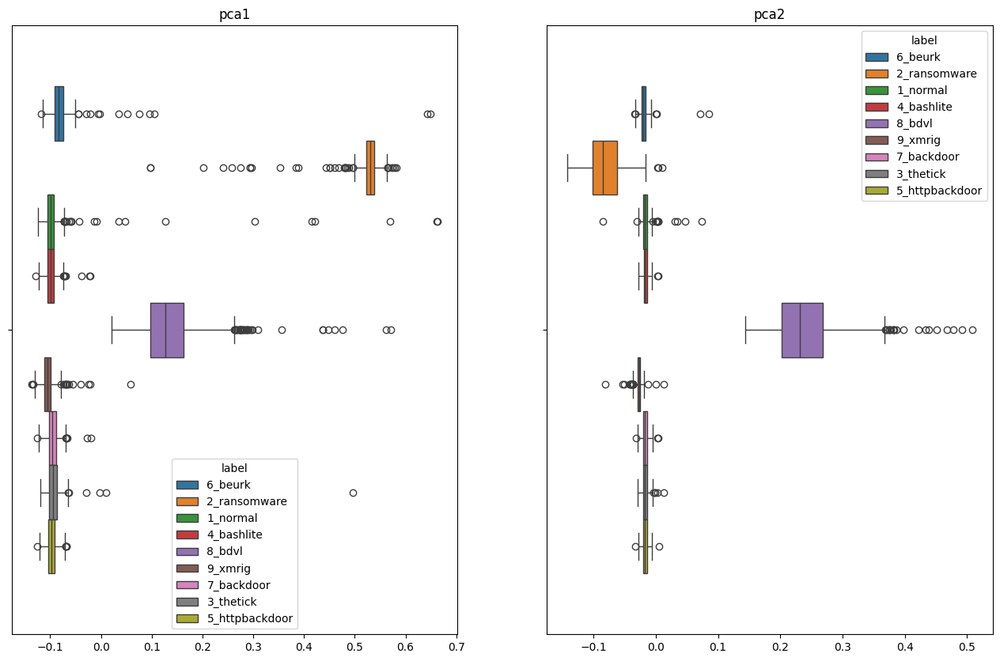

: 

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(16, 10))

axs = axs.flatten()


for i, column in enumerate(df_pca.columns):
    if column == "label" or column == "timestamp":
        continue

    sns.boxplot(data=df_pca, x=column, ax=axs[i], hue="label", native_scale=True, orient="h",
                legend=True)
    axs[i].set_title(f'{column}')
    axs[i].set_xlabel('')

plt.show()